In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import squidpy as sq

In [2]:
adata = sc.read_10x_h5(
    filename="ZB4171/Xenium_V1_FFPE_wildtype_2_5_months_outs/cell_feature_matrix.h5"
)

In [3]:
adata

AnnData object with n_obs × n_vars = 58231 × 347
    var: 'gene_ids', 'feature_types', 'genome'

In [5]:
df = pd.read_csv(
    "ZB4171/Xenium_V1_FFPE_wildtype_2_5_months_outs/cells.csv.gz", compression="gzip"
)

In [6]:
df

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,total_counts,cell_area,nucleus_area
0,aaaaiiag-1,828.558304,846.772968,233,0,0,0,233,223.523438,49.400938
1,aaabdjmb-1,849.492407,859.893961,333,0,0,0,333,439.957344,38.608594
2,aaacjpoi-1,840.098569,721.268890,263,0,0,0,263,317.538750,30.480469
3,aaadncba-1,846.790710,735.106085,390,0,0,0,390,335.375469,61.096406
4,aaafjoec-1,395.455470,873.565710,180,0,0,0,180,242.940625,34.002656
...,...,...,...,...,...,...,...,...,...,...
58226,oiodejmp-1,4186.771704,4341.463818,125,0,0,0,125,299.927813,70.850156
58227,oiohfcbe-1,4144.184961,4306.244849,66,0,0,0,66,81.687656,27.725938
58228,oioifaid-1,4184.923535,4323.685205,116,0,0,0,116,182.295781,75.456094
58229,oioipdka-1,4173.490454,4323.492627,143,0,0,0,143,261.454688,67.463437


In [7]:
df.set_index(adata.obs_names, inplace=True)
adata.obs = df.copy()

In [8]:
adata.obsm["spatial"] = adata.obs[["x_centroid", "y_centroid"]].copy().to_numpy()

In [9]:
adata.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,unassigned_codeword_counts,total_counts,cell_area,nucleus_area
aaaaiiag-1,aaaaiiag-1,828.558304,846.772968,233,0,0,0,233,223.523438,49.400938
aaabdjmb-1,aaabdjmb-1,849.492407,859.893961,333,0,0,0,333,439.957344,38.608594
aaacjpoi-1,aaacjpoi-1,840.098569,721.268890,263,0,0,0,263,317.538750,30.480469
aaadncba-1,aaadncba-1,846.790710,735.106085,390,0,0,0,390,335.375469,61.096406
aaafjoec-1,aaafjoec-1,395.455470,873.565710,180,0,0,0,180,242.940625,34.002656
...,...,...,...,...,...,...,...,...,...,...
oiodejmp-1,oiodejmp-1,4186.771704,4341.463818,125,0,0,0,125,299.927813,70.850156
oiohfcbe-1,oiohfcbe-1,4144.184961,4306.244849,66,0,0,0,66,81.687656,27.725938
oioifaid-1,oioifaid-1,4184.923535,4323.685205,116,0,0,0,116,182.295781,75.456094
oioipdka-1,oioipdka-1,4173.490454,4323.492627,143,0,0,0,143,261.454688,67.463437


In [76]:
adata.to_df()

,2010300C02Rik,Abca7,Acsbg1,Acta2,Acvrl1,Adamts2,Adamtsl1,Adgrl4,Aldh1a2,Aldh1l1,...,Unc13c,Vat1l,Vcan,Vim,Vip,Vwc2l,Wfs1,Zfp366,Zfp536,Zfpm2
aaaaiiag-1,0.000000,0.0,0.000000,0.0,0.000000,1.417976,0.000000,0.000000,0.0,0.714379,...,0.0,1.982037,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0
aaabdjmb-1,0.000000,0.0,1.159767,0.0,0.000000,0.000000,0.899942,1.365816,0.0,0.547965,...,0.0,0.899942,0.547965,0.0,0.0,0.000000,0.000000,0.899942,0.000000,0.0
aaacjpoi-1,0.654383,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,1.327569,...,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0
aaadncba-1,0.484324,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.484324,...,0.0,0.809219,0.484324,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0
aaafjoec-1,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,2.047693,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.854415,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oiodejmp-1,1.079769,0.0,0.000000,0.0,0.000000,1.586783,0.000000,0.000000,0.0,0.000000,...,0.0,1.079769,0.000000,0.0,0.0,0.000000,1.079769,0.000000,0.000000,0.0
oiohfcbe-1,0.000000,0.0,0.000000,0.0,1.543687,0.000000,0.000000,0.000000,0.0,1.543687,...,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0
oioifaid-1,1.985746,0.0,0.000000,0.0,0.000000,1.129732,0.000000,0.000000,0.0,1.129732,...,0.0,1.129732,0.000000,0.0,0.0,1.129732,0.000000,1.129732,0.000000,0.0
oioipdka-1,1.481287,0.0,0.992993,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,0.000000,0.000000,0.0,0.0,0.000000,2.053765,0.000000,0.000000,0.0


**Quality Control**

In [10]:
sc.pp.calculate_qc_metrics(adata, percent_top=(10, 20, 50, 150), inplace=True)

In [11]:
cprobes = (
    adata.obs["control_probe_counts"].sum() / adata.obs["total_counts"].sum() * 100
)
cwords = (
    adata.obs["control_codeword_counts"].sum() / adata.obs["total_counts"].sum() * 100
)
print(f"Negative DNA probe count % : {cprobes}")
print(f"Negative decoding count % : {cwords}")

Negative DNA probe count % : 0.010536763877277677
Negative decoding count % : 0.004821249892186095


C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Conver

<Axes: title={'center': 'Nucleus ratio'}, ylabel='Count'>

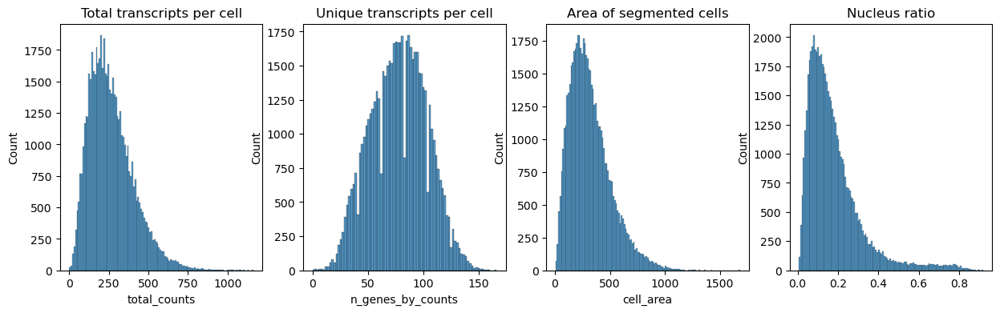

In [12]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)


axs[2].set_title("Area of segmented cells")
sns.histplot(
    adata.obs["cell_area"],
    kde=False,
    ax=axs[2],
)

axs[3].set_title("Nucleus ratio")
sns.histplot(
    adata.obs["nucleus_area"] / adata.obs["cell_area"],
    kde=False,
    ax=axs[3],
)

In [13]:
sc.pp.filter_cells(adata, min_counts=10)
sc.pp.filter_genes(adata, min_cells=5)

In [14]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [32]:
sc.tl.leiden(adata, resolution=0.8, key_added='leiden_08')

In [34]:
sc.tl.leiden(adata, resolution=0.6, key_added='leiden_06')

C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


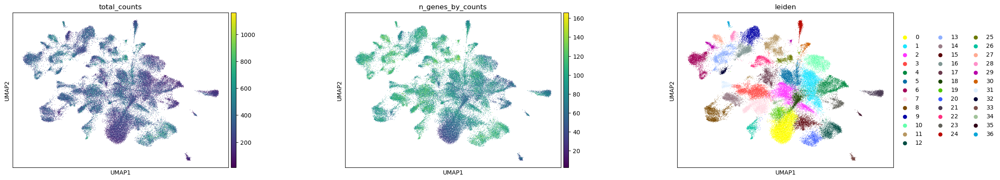

In [15]:
sc.pl.umap(
    adata,
    color=[
        "total_counts",
        "n_genes_by_counts",
        "leiden",
    ],
    wspace=0.4,
)

C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\squidpy\pl\_spatial_utils.py:747: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if c is not None and c in adata.obs and is_categorical_dtype(adata.obs[c]):
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\squidpy\pl\_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\squidpy\pl\_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
C:\Users\Acer\anaconda3\envs\f

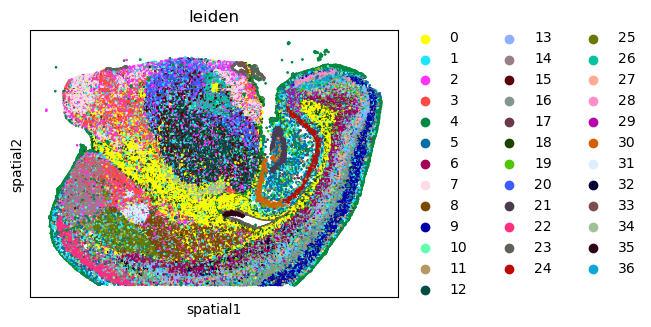

In [16]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden",
    ],
    wspace=0.4,
)

C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


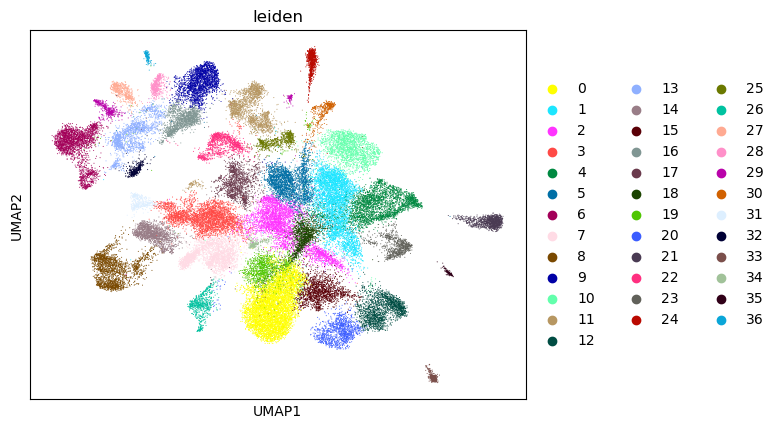

In [31]:
sc.pl.umap(
    adata,
    color=[
        "leiden"
    ],
    wspace=0.4,
)

C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


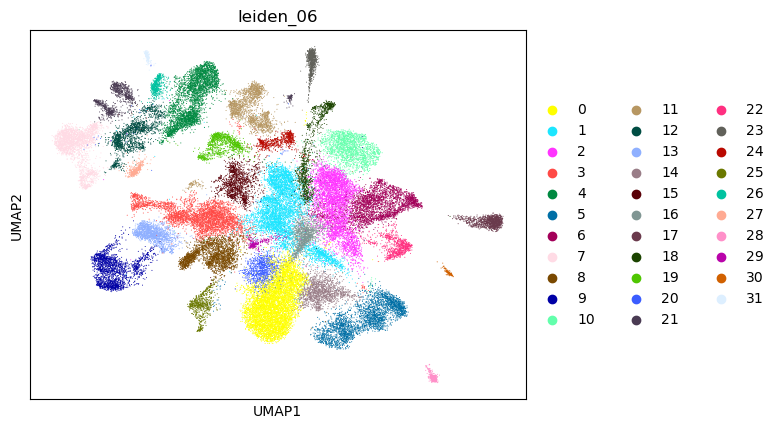

In [35]:
sc.pl.umap(
    adata,
    color=[
        "leiden_06"
    ],
    wspace=0.4,
)

C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


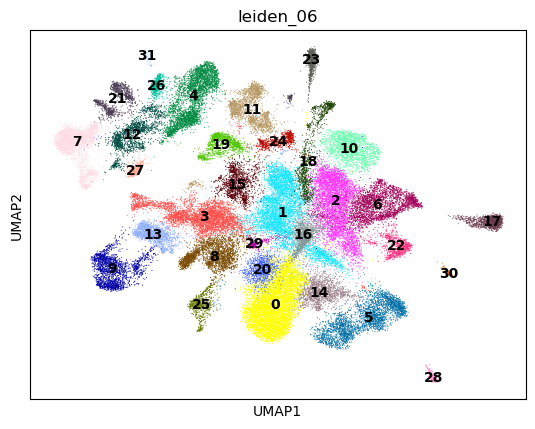

In [39]:
sc.pl.umap(
    adata,
    color=[
        "leiden_06"],
    legend_loc='on data',
    wspace=0.4,
)

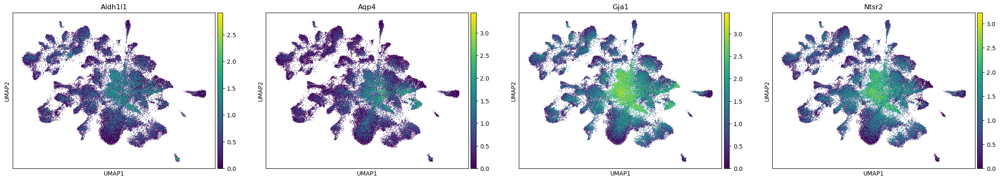

In [23]:
#Astrocytes, L06-1
sc.pl.umap(adata,
           color=["Aldh1l1", "Aqp4", "Gja1", "Ntsr2"],
           legend_loc="on data",
           size=5,
           palette= "tab20")

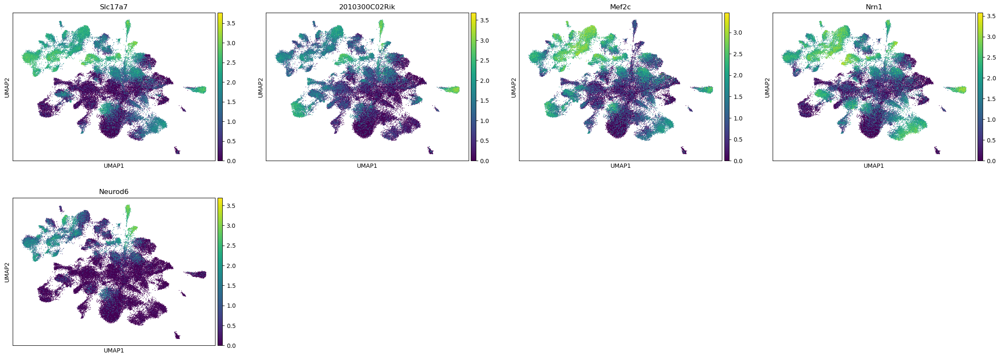

In [24]:
#Excitory Neurons
sc.pl.umap(adata,
           color=["Slc17a7", "2010300C02Rik", "Mef2c", "Nrn1", "Neurod6"],
           legend_loc="on data",
           size=5,
           palette= "tab20")

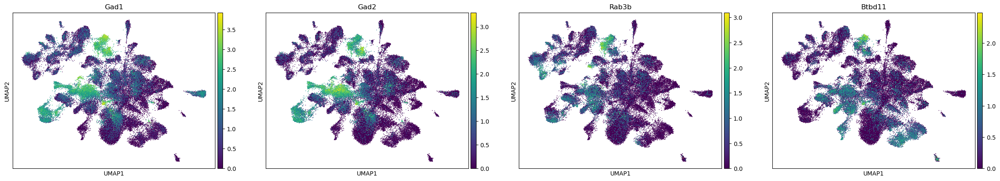

In [25]:
#Inhibitory Neurons
sc.pl.umap(adata,
           color=["Gad1", "Gad2", "Rab3b", "Btbd11"],
           legend_loc="on data",
           size=5,
           palette= "tab20")

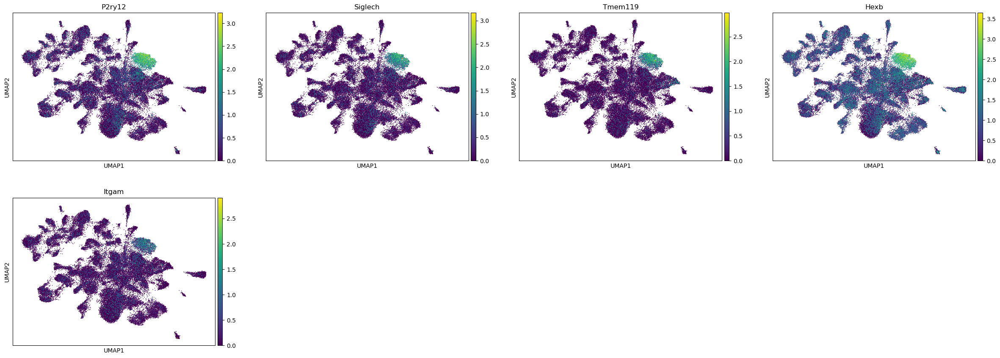

In [26]:
#Microglia, L06-10
sc.pl.umap(adata,
           color=["P2ry12", "Siglech", "Tmem119", "Hexb", "Itgam"],
           legend_loc="on data",
           size=5,
           palette= "tab20")

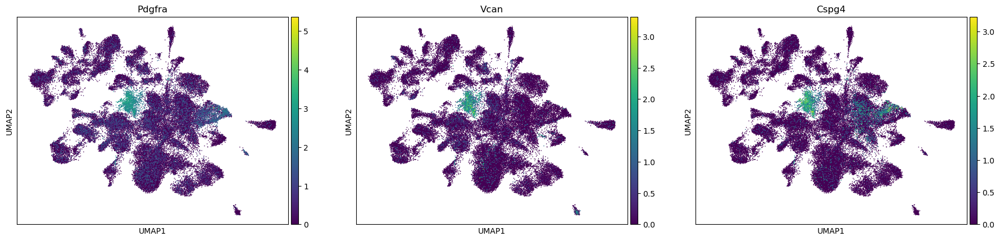

In [27]:
#OPC, L06-15
sc.pl.umap(adata,
           color=["Pdgfra", "Vcan", "Cspg4"],
           legend_loc="on data",
           size=5,
           palette= "tab20")

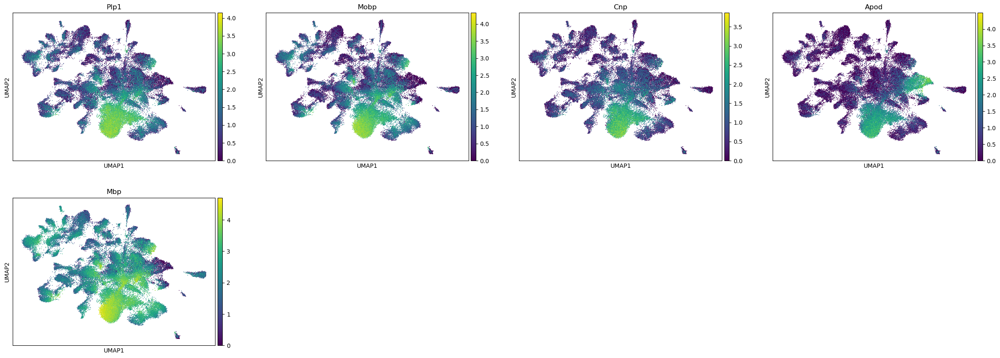

In [28]:
#Oligodendrocytes, L06-0
sc.pl.umap(adata,
           color=["Plp1", "Mobp", "Cnp", "Apod", "Mbp"],
           legend_loc="on data",
           size=5,
           palette= "tab20")

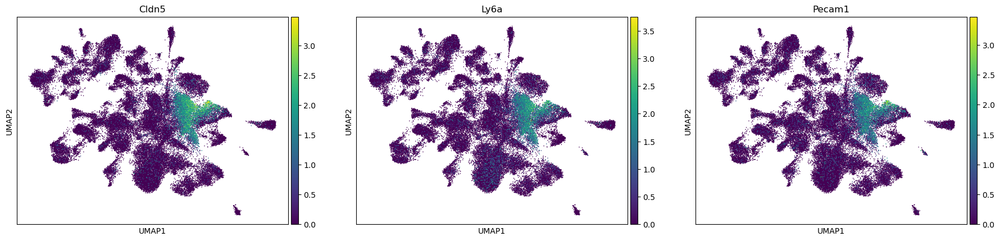

In [29]:
#Perciytes/Endothelial, L06-2
sc.pl.umap(adata,
           color=["Cldn5", "Ly6a", "Pecam1"],
           legend_loc="on data",
           size=5,
           palette= "tab20")

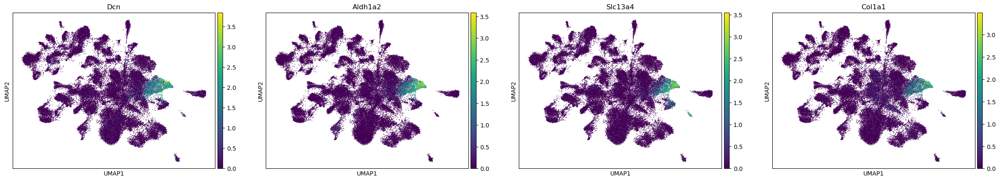

In [30]:
#Fibroblast, L06-6
sc.pl.umap(adata,
           color=["Dcn", "Aldh1a2", "Slc13a4", "Col1a1"],
           legend_loc="on data",
           size=5,
           palette= "tab20")

In [16]:
labels= {"0":"Oligodendrocytes",
'1':'Astrocytes',
'2':'Perciytes/Endothelial',
'3':"Inhibitory Neurons",
'4':"Excitory Neurons",
'5':"Excitory Neurons",
'6':"Fibroblast",
'7':"Excitory Neurons",
'8':"-",
'9':"-",
'10':"Microglia",
'11':"Inhibitory Neurons",
'12':"Excitory Neurons",
'13':"Excitory Neurons",
'14':"Oligodendrocytes",
'15':"OPC",
'16':"Astrocytes",
'17':"Excitory Neurons",
'18':"Excitory Neurons",
'19':"Excitory Neurons",
'20':"Excitory Neurons",
'21':"Excitory Neurons",
'22':"Astrocytes",
'23':"Excitory Neurons",
'24':"Excitory Neurons",
'25':"-",
'26':"Excitory Neurons",
'27':"Excitory Neurons",
'28':"-",
'29':"Inhibitory Neurons",
'30':"-",
'31':"Excitory Neurons"}

In [17]:
# Assign cell type labels to single cells in adata
adata.obs["cell_type"] = adata.obs["leiden_06"].map(labels)

In [18]:
adata.obs["cell_type"]

aaaaiiag-1                        -
aaabdjmb-1    Perciytes/Endothelial
aaacjpoi-1                        -
aaadncba-1                Microglia
aaafjoec-1       Inhibitory Neurons
                      ...          
oiodejmp-1         Excitory Neurons
oiohfcbe-1               Fibroblast
oioifaid-1         Excitory Neurons
oioipdka-1         Excitory Neurons
oiokkmhe-1         Excitory Neurons
Name: cell_type, Length: 58208, dtype: object

C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


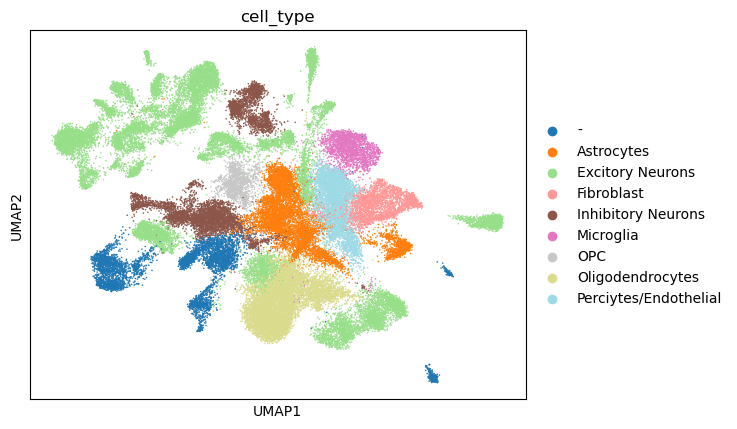

In [19]:
sc.pl.umap(adata,
           color=['cell_type'],
           size=5,
           palette= "tab20")

C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\squidpy\pl\_spatial_utils.py:747: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if c is not None and c in adata.obs and is_categorical_dtype(adata.obs[c]):
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\squidpy\pl\_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\squidpy\pl\_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
C:\Users\Acer\anaconda3\envs\f

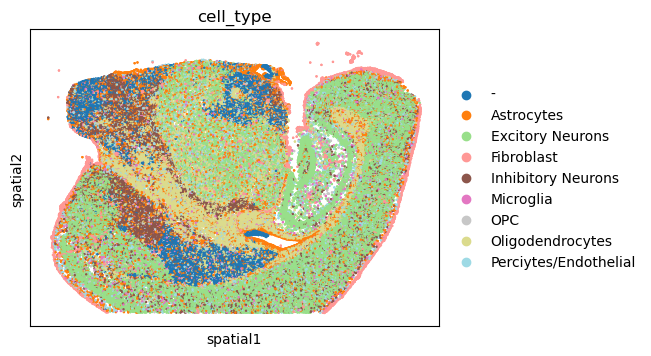

In [21]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=["cell_type"],
    wspace=0.4,
)

C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\squidpy\pl\_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
C:\Users\Acer\anaconda3\envs\fel_conda\Lib\site-packages\squidpy\pl\_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if is_categorical_dtype(color_source_vector):


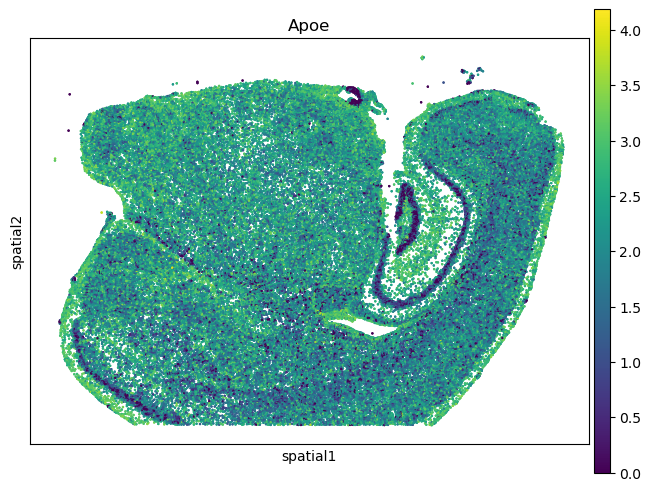

In [63]:
#Apoe
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=["Apoe"],
    wspace=0.4,
)

In [22]:
adata

AnnData object with n_obs × n_vars = 58208 × 347
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'leiden_08', 'leiden_06', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'leiden', 'leiden_06_colors', 'leiden_08_colors', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [23]:
adata.write("Xenium_WT_25.h5ad")

In [24]:
adata= sc.read_h5ad("Xenium_WT_25.h5ad")

In [25]:
adata

AnnData object with n_obs × n_vars = 58208 × 347
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'leiden_08', 'leiden_06', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'cell_type_colors', 'leiden', 'leiden_06_colors', 'leiden_08_colors', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'